# **DETECCIÓN DE LA PELOTA**

En este notebook se presenta el módulo encargado de la detección y seguimiento de la pelota en partidos de tenis mediante una arquitectura de aprendizaje profundo especializada (TrackNet), diseñada para procesar secuencias temporales. Asimismo, se aborda la generación de la trayectoria final y el cálculo de coordenadas precisas a partir de los mapas de calor obtenidos en cada inferencia.


In [ ]:
!pip install kaggle opencv-python matplotlib numpy torch torchvision tqdm fastai > /dev/null 2>&1

## **BIBLIOTECAS UTILIZADAS**

In [1]:
import cv2
import os
import glob
import numpy as np
from collections import deque
from tqdm.auto import tqdm
from google.colab import files
from google.colab import drive
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import random
import matplotlib.pyplot as plt
import shutil

## **DATASET: TRACKNET**

Estas primeras celdas de código son **comunes** en el resto de notebooks, encargadas de **cargar y preparar el conjunto de datos** que se utilizará a lo largo del proyecto para **validar** tanto **el comportamiento de los modelos entrenados** como **las técnicas de procesado de imágenes** implementadas.

Para facilitar el acceso al dataset, que se encuentra en la plataforma **Kaggle**, se establece el acceso a Google Drive, donde se va a guardar la **clave de autenticación de usuario** (`kaggle.json`) de dicha plataforma para poder descargarlo directamente desde sus servidores.



In [3]:
drive.mount('/content/drive')

!mkdir -p ~/.kaggle

!cp /content/drive/MyDrive/dataset_tennis/kaggle.json ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json

!ls -l ~/.kaggle
!kaggle datasets list | head

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
total 4
-rw------- 1 root root 71 Jan 16 17:03 kaggle.json
ref                                                              title                                                    size  lastUpdated                 downloadCount  voteCount  usabilityRating  
---------------------------------------------------------------  -------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
neurocipher/heartdisease                                         Heart Disease                                            3491  2025-12-11 15:29:14.327000           2114        289  1.0              
rockyt07/social-media-user-analysis                              Social Media User Analysis                          247842357  2026-01-14 02:28:41.970000              0         66  1.0              
neurocipher/

Finalmente, se descarga el dataset **TrackNet Tennis**, que contiene **secuencias de vídeo** de partidos de tenis junto con la estructura necesaria para tareas de detección y seguimiento. En concreto, es el conjunto de datos específico para **entrenamiento de modelos de ML y redes neuronales** para la detección y seguimiento de **pelotas de tenis**, pero, en nuestro caso, vamos a utilizarlo también para **validar nuestro trabajo**.  

In [ ]:
!kaggle datasets download -d sofuskonglevoll/tracknet-tennis -p data

Dataset URL: https://www.kaggle.com/datasets/sofuskonglevoll/tracknet-tennis
License(s): unknown
 94% 2.25G/2.39G [00:01<00:00, 1.61GB/s]
100% 2.39G/2.39G [00:01<00:00, 1.68GB/s]


In [ ]:
# Estás en /content normalmente
!mkdir -p data/tracknet
!unzip -q -o data/tracknet-tennis.zip -d data/tracknet

In [ ]:
for root, dirs, files in os.walk("data/tracknet"):
    # limitar profundidad para no imprimir 1000 líneas
    rel = os.path.relpath(root, "data/tracknet")
    depth = rel.count(os.sep)
    if depth > 2:
        continue
    indent = "  " * depth
    print(f"{indent}{os.path.basename(root)}/")
    for f in files[:5]:   # solo los 5 primeros de cada carpeta
        print(f"{indent}  {f}")

tracknet/
Dataset/
  Readme.docx
  game7/
    Clip3/
      0026.jpg
      0002.jpg
      0030.jpg
      0029.jpg
      0045.jpg
    Clip2/
      0076.jpg
      0026.jpg
      0098.jpg
      0177.jpg
      0193.jpg
    Clip5/
      0076.jpg
      0026.jpg
      0098.jpg
      0177.jpg
      0193.jpg
    Clip4/
      0076.jpg
      0026.jpg
      0473.jpg
      0344.jpg
      0098.jpg
    Clip9/
      0076.jpg
      0026.jpg
      0002.jpg
      0030.jpg
      0029.jpg
    Clip8/
      0026.jpg
      0002.jpg
      0030.jpg
      0029.jpg
      0045.jpg
    Clip1/
      0076.jpg
      0026.jpg
      0098.jpg
      0117.jpg
      0112.jpg
    Clip7/
      0076.jpg
      0026.jpg
      0098.jpg
      0117.jpg
      0112.jpg
    Clip6/
      0076.jpg
      0026.jpg
      0098.jpg
      0002.jpg
      0030.jpg
  game2/
    Clip3/
      0026.jpg
      0002.jpg
      0030.jpg
      0029.jpg
      0032.jpg
    Clip2/
      0076.jpg
      0026.jpg
      0098.jpg
      0177.jpg
      0193.jpg
   

Aqui podemos observar el dataset, que esta formado por 10 games y que cada game está formado por varios clips, esos clips son una secuencia de imagenes.

## **BÚSQUEDA DE CSV**


In [ ]:
import glob

csv_files = glob.glob("data/tracknet/**/*.csv", recursive=True)
print("CSV encontrados:")
for i, f in enumerate(csv_files):
  print(i, "->", f)

CSV encontrados:
0 -> data/tracknet/Dataset/game7/Clip3/Label.csv
1 -> data/tracknet/Dataset/game7/Clip2/Label.csv
2 -> data/tracknet/Dataset/game7/Clip5/Label.csv
3 -> data/tracknet/Dataset/game7/Clip4/Label.csv
4 -> data/tracknet/Dataset/game7/Clip9/Label.csv
5 -> data/tracknet/Dataset/game7/Clip8/Label.csv
6 -> data/tracknet/Dataset/game7/Clip1/Label.csv
7 -> data/tracknet/Dataset/game7/Clip7/Label.csv
8 -> data/tracknet/Dataset/game7/Clip6/Label.csv
9 -> data/tracknet/Dataset/game2/Clip3/Label.csv
10 -> data/tracknet/Dataset/game2/Clip2/Label.csv
11 -> data/tracknet/Dataset/game2/Clip5/Label.csv
12 -> data/tracknet/Dataset/game2/Clip4/Label.csv
13 -> data/tracknet/Dataset/game2/Clip8/Label.csv
14 -> data/tracknet/Dataset/game2/Clip1/Label.csv
15 -> data/tracknet/Dataset/game2/Clip7/Label.csv
16 -> data/tracknet/Dataset/game2/Clip6/Label.csv
17 -> data/tracknet/Dataset/game9/Clip3/Label.csv
18 -> data/tracknet/Dataset/game9/Clip2/Label.csv
19 -> data/tracknet/Dataset/game9/Clip5/Lab

Vemos que en total hay 95 clips.

In [ ]:
valid_csv_files = []
# Definimos exactamente lo que vimos que tienes
required_columns = {'file name', 'x-coordinate', 'y-coordinate'}

for c in csv_files:
    try:
        # Leemos solo cabecera
        df_head = pd.read_csv(c, nrows=0)

        # Quitamos espacios extra en los nombres de columnas
        df_head.columns = df_head.columns.str.strip()

        # Verificamos si tenemos las 3 columnas mágicas
        if required_columns.issubset(df_head.columns):
            valid_csv_files.append(c)
        else:
            # Si falla, imprimimos por qué (solo para el primero)
            if len(valid_csv_files) == 0:
                print(f"Rechazado {c}. Columnas detectadas: {df_head.columns.tolist()}")

    except Exception as e:
        print(f"Error leyendo {c}: {e}")

print(f"Archivos válidos para TrackNet: {len(valid_csv_files)} de {len(csv_files)}")

Archivos válidos para TrackNet: 95 de 95


Comprobamos que todos los archivos son correctos.

In [ ]:
games_data = {}

for csv_path in valid_csv_files:
    try:
        # 1. Cargar datos
        df = pd.read_csv(csv_path)

        # 2. Limpieza: Eliminar filas sin coordenadas (visibilidad 0)
        df.dropna(subset=['x-coordinate', 'y-coordinate'], inplace=True)

        # 3. Construir ruta completa de imagen
        folder = os.path.dirname(csv_path)
        df['img_path'] = folder + os.sep + df['file name']

        # 4. ORDENAR (Vital para video)
        df.sort_values('img_path', inplace=True)

        # 5. Validaciones de integridad
        if len(df) < 3: continue # Muy corto
        if not os.path.exists(df.iloc[0]['img_path']): continue # Imagen no existe

        # 6. Guardar en estructura: games_data[game_id][clip_id]
        # Ruta ejemplo: .../game8/Clip9/Label.csv
        clip_id = os.path.basename(folder)                # Clip9
        game_id = os.path.basename(os.path.dirname(folder)) # game8

        # Crear diccionario si no existe y guardar DF
        games_data.setdefault(game_id, {})[clip_id] = df

    except Exception as e:
        print(f"Error en {csv_path}: {e}")

print(f"Partidos cargados correctamente: {list(games_data.keys())}")

Partidos cargados correctamente: ['game7', 'game2', 'game9', 'game6', 'game4', 'game8', 'game10', 'game3', 'game5', 'game1']


### **DIVISIÓN EN TRAIN, VALIDATION Y TEST**

In [ ]:
all_games = sorted(list(games_data.keys()))


print("info: Dataset estándar detectado. Usando split fijo 6-2-2.")
train_games = [f'game{i}' for i in range(1, 7)] # game1 ... game6
val_games   = ['game7', 'game8']
# test_games = ['game9', 'game10'] (Reservados, no los tocamos ahora)

print(f"ENTRENAMIENTO: {len(train_games)} partidos ({train_games})")
print(f"VALIDACIÓN:    {len(val_games)} partidos ({val_games})")

info: Dataset estándar detectado. Usando split fijo 6-2-2.
ENTRENAMIENTO: 6 partidos (['game1', 'game2', 'game3', 'game4', 'game5', 'game6'])
VALIDACIÓN:    2 partidos (['game7', 'game8'])


El conjunto de datos se organiza jerárquicamente en **10 partidos (*games*)**. Cada una de estas unidades se subdivide en múltiples *clips*, los cuales están constituidos por secuencias de imágenes consecutivas. Esta estructura es fundamental, ya que preserva la coherencia temporal necesaria para que el modelo aprenda la dinámica de movimiento de la pelota.

Para garantizar una evaluación rigurosa y evitar el sesgo en los resultados, **se ha procedido a una partición de los datos** (Data Split) siguiendo una distribución estratégica 60/20/20:

* **Conjunto de Entrenamiento (Train):** 6 Partidos.
* **Conjunto de Validación (Validation):** 2 Partidos.
* **Conjunto de Prueba (Test):** 2 Partidos.


### **CREACIÓN DE SECUENCIAS (VENTANA DESLIZANTE)**

In [ ]:
def create_sequences(game_list):
    seqs = []
    # Filtrar solo juegos que realmente cargamos
    valid_games = [g for g in game_list if g in games_data]

    for g in valid_games:
        for clip_df in games_data[g].values():
            # Convertimos a listas para iterar muy rápido
            paths = clip_df['img_path'].tolist()
            xs = clip_df['x-coordinate'].tolist()
            ys = clip_df['y-coordinate'].tolist()

            # Ventana deslizante: Para cada frame 'i', tomamos el anterior y el siguiente
            for i in range(1, len(paths) - 1):
                seqs.append({
                    'paths': [paths[i-1], paths[i], paths[i+1]], # Input: 3 imágenes
                    'target_x': xs[i],                           # Output: Coordenada central
                    'target_y': ys[i]
                })
    return seqs

# Ejecutar generación
train_seqs = create_sequences(train_games)
val_seqs   = create_sequences(val_games)

print(f"   Muestras de Train: {len(train_seqs)}")
print(f"   Muestras de Val:   {len(val_seqs)}")

   Muestras de Train: 11760
   Muestras de Val:   3573


La detección precisa de objetos en movimiento rápido requiere información que trascienda el plano estático. Dado que una imagen individual carece de vectores de movimiento, se ha implementado una estrategia de preprocesamiento basada en **ventanas temporales**. Como la que se indica en el paper original de Tracknet.

Esta función reestructura el conjunto de datos agrupando los fotogramas en **secuencias de tres imágenes consecutivas**, lo que constituye el tensor de entrada para la red:

1. Fotograma Previo ($t-1$)
2. Fotograma Actual ($t$) $\rightarrow$ **Foco de la predicción**.
3. Fotograma Posterior ($t+1$)

**Objetivo del Modelo:**
La red neuronal se entrena para inferir las coordenadas espaciales $(x, y)$ de la pelota situadas en el **fotograma central**, utilizando la información visual de los cuadros adyacentes para resolver ambigüedades y estimar la trayectoria.

**Consolidación del Dataset:**
Tras aplicar este algoritmo de secuenciación a los bloques de entrenamiento y validación, se ha generado la lista definitiva de muestras formateadas para su ingestión en PyTorch. El volumen total de datos procesados es el siguiente:

* **Muestras de Entrenamiento (Train):** 11,760 secuencias.
* **Muestras de Validación (Val):** 3,573 secuencias.


## **CREACIÓN DEL DATASET Y DATA AUGMENTATION**

In [ ]:
TARGET_W = 640
TARGET_H = 360
BATCH_SIZE = 32

class TrackNetDataset(Dataset):
    def __init__(self, sequences, input_height=360, input_width=640, is_train=False):
        self.sequences = sequences
        self.h = input_height
        self.w = input_width
        self.is_train = is_train
        self.xx, self.yy = np.meshgrid(np.arange(self.w), np.arange(self.h))

    def __len__(self):
        return len(self.sequences)

    def generate_heatmap(self, center_x, center_y, sigma=2.5):
        dist_sq = (self.xx - center_x)**2 + (self.yy - center_y)**2
        heatmap = np.exp(-dist_sq / (2 * sigma**2))
        return heatmap.astype(np.float32)

    def load_and_resize_rgb(self, path, aug_params=None):
        img = cv2.imread(path)
        if img is None:
            img = np.zeros((self.h, self.w, 3), dtype=np.uint8)
        else:
            img = cv2.resize(img, (self.w, self.h))

        # Conversión a RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # APLICAR DATA AUGMENTATION
        if aug_params:
            # 1. Brillo/Contraste
            if 'alpha' in aug_params:
                # alpha: contraste (1.0 = original), beta: brillo
                img_rgb = cv2.convertScaleAbs(img_rgb, alpha=aug_params['alpha'], beta=aug_params['beta'])

            # 2. Ruido (Simular grano de cámara mala)
            if 'noise' in aug_params and aug_params['noise']:
                row, col, ch = img_rgb.shape
                mean = 0
                sigma = 15 # Intensidad del ruido
                gauss = np.random.normal(mean, sigma, (row, col, ch))
                gauss = gauss.reshape(row, col, ch)
                # Sumamos ruido y aseguramos que esté entre 0 y 255
                img_rgb = cv2.add(img_rgb, gauss.astype(np.uint8))

        # Normalizar [0, 1] y Transponer
        img_norm = img_rgb.astype(np.float32) / 255.0
        img_tensor = np.transpose(img_norm, (2, 0, 1))

        orig_h, orig_w = img.shape[:2]

        return img_tensor

    def __getitem__(self, idx):
        seq = self.sequences[idx]
        paths = seq['paths']

        # GENERAR PARÁMETROS ALEATORIOS (SOLO UNA VEZ POR TRÍO)
        aug_params = {}
        if self.is_train:
            # 50% de probabilidad de cambiar brillo/contraste
            if random.random() > 0.5:
                aug_params['alpha'] = random.uniform(0.7, 1.3) # Contraste +/- 30%
                aug_params['beta']  = random.uniform(-20, 20)  # Brillo +/- 20

            # 30% de probabilidad de añadir ruido
            if random.random() > 0.7:
                aug_params['noise'] = True

        temp_img = cv2.imread(paths[1])
        if temp_img is None: orig_h, orig_w = 720, 1280 # Fallback
        else: orig_h, orig_w = temp_img.shape[:2]

        t0 = self.load_and_resize_rgb(paths[0], aug_params)
        t1 = self.load_and_resize_rgb(paths[1], aug_params)
        t2 = self.load_and_resize_rgb(paths[2], aug_params)

        # Concatenar (9 canales)
        input_tensor = np.concatenate([t0, t1, t2], axis=0)

        scale_x = self.w / orig_w
        scale_y = self.h / orig_h
        target_x = seq['target_x'] * scale_x
        target_y = seq['target_y'] * scale_y

        gt_heatmap = self.generate_heatmap(target_x, target_y)
        gt_heatmap = gt_heatmap[np.newaxis, :, :]

        return torch.from_numpy(input_tensor), torch.from_numpy(gt_heatmap)

Se ha desarrollado la clase personalizada `TrackNetDataset` para gestionar la carga y el preprocesamiento de los datos. Para optimizar el rendimiento y la convergencia del modelo, **se han implementado tres estrategias clave**:

1. **Generación de Mapas de Calor (Heatmaps):**
En lugar de configurar la red para una regresión de coordenadas exactas (lo cual suele dificultar la convergencia), se ha optado por la generación de mapas de calor con distribución gaussiana centrados en la posición de la pelota. Esta aproximación facilita el aprendizaje de la red neuronal al transformar el problema en una estimación de densidad espacial.

2. **Estructura de Entrada de 9 Canales:**
Dado que el modelo procesa secuencias temporales compuestas por tres fotogramas (pasado, presente y futuro), se ha procedido a concatenar los canales RGB de cada una. Esto da como resultado un tensor de entrada de **9 canales** (3 frames x 3 canales), permitiendo que el modelo capture eficazmente la trayectoria y velocidad del objeto. Dado que la pelota de tenis se caracteriza principalmente por su color amarillo llamativo, convertir las imágenes a escala de grises elimina una de las señales visuales más discriminativas para su identificación. En ausencia de información cromática, la pelota pasa a representarse únicamente por su intensidad, lo que provoca que su apariencia sea muy similar a la de otros elementos de la escena, como las líneas de la pista, el fondo o reflejos de iluminación. Esta pérdida de contraste semántico dificulta notablemente su diferenciación, incrementando la probabilidad de confusión por ello es necesario obtener los 3 canales.

3. **Data Augmentation Sincronizado:**
Para incrementar la robustez del modelo ante variaciones de iluminación y ruido, se aplican transformaciones aleatorias bajo una lógica de coherencia temporal:
    * Los parámetros de transformación (ej. incremento de brillo del 10%) se calculan **una única vez por secuencia**.
    * De esta manera, se garantiza la consistencia visual entre los tres fotogramas consecutivos. Si se aplicaran cambios dispares a cada imagen, se introducirían artefactos que el modelo podría interpretar erróneamente como cambios físicos en el entorno, afectando negativamente al entrenamiento.

    Además, no se aplican transformaciones de deformación geométrica sobre las imágenes, ya que la estructura visual de la pelota constituye una característica clave para su correcta detección. La pelota de tenis presenta una forma aproximadamente circular y un patrón de bordes bien definido, que el modelo aprende a reconocer como parte de su representación.


### **INSTANCIA DE DATASETS Y LOADERS**

In [ ]:
# ACTIVAMOS is_train=True SOLO PARA TRAIN
train_ds = TrackNetDataset(train_seqs, input_height=TARGET_H, input_width=TARGET_W, is_train=True)

# Validation SIEMPRE is_train=False
val_ds   = TrackNetDataset(val_seqs,   input_height=TARGET_H, input_width=TARGET_W, is_train=False)

# DataLoaders
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=8, pin_memory=True)

print(f"Augmentation activado. Train: {len(train_ds)} muestras | Val: {len(val_ds)} muestras")

Augmentation activado. Train: 11760 muestras | Val: 3573 muestras




Ahora creamos los objetos finales que le pasarán los datos a la GPU.

El detalle importante aquí es el parámetro `is_train`:

* **Para Entrenamiento (`True`):** Activamos el "Data Augmentation". Queremos que el modelo vea imágenes con ruido y cambios de luz para que no memorice los partidos y aprenda a generalizar.
* **Para Validación (`False`):** Desactivamos los efectos. La validación debe ser una prueba justa con imágenes limpias y reales, tal cual vienen del vídeo.

Finalmente, usamos `shuffle=True` solo en entrenamiento para mezclar los clips en cada época y romper patrones.

### **VERIFICACIÓN VISUAL**

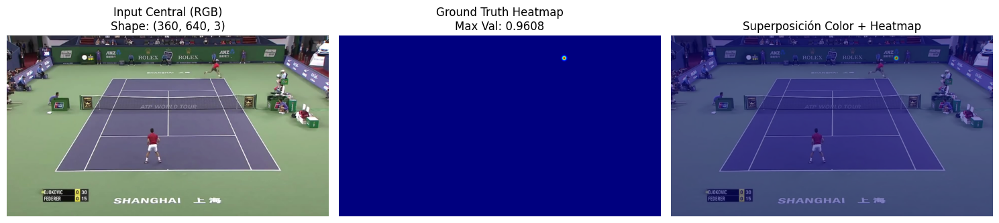

In [ ]:
 show_verification_sample(dataset, idx=0):
    # 1. Sacamos los tensores del dataset
    x, y = dataset[idx]

    # 2. Convertimos a Numpy
    # x shape: (9, 360, 640) -> 3 frames x 3 canales RGB
    frames = x.numpy()
    heatmap = y.numpy()[0] # (360, 640)

    # 3. Extraemos el Frame Central (t)
    img_central = frames[3:6, :, :] # Shape (3, 360, 640)

    # 4. Transponer para Matplotlib
    # Matplotlib necesita (Alto, Ancho, Canales) -> (360, 640, 3)
    img_display = np.transpose(img_central, (1, 2, 0))

    # 5. Plotting
    plt.figure(figsize=(15, 5))

    # A) Imagen RGB (Input real)
    plt.subplot(1, 3, 1)
    plt.title(f"Input Central (RGB)\nShape: {img_display.shape}")
    plt.imshow(img_display) # Ya no usamos cmap="gray"
    plt.axis("off")

    # B) Ground Truth Heatmap
    plt.subplot(1, 3, 2)
    plt.title(f"Ground Truth Heatmap\nMax Val: {heatmap.max():.4f}")
    plt.imshow(heatmap, cmap="jet")
    plt.axis("off")

    # C) Superposición
    plt.subplot(1, 3, 3)
    plt.title("Superposición Color + Heatmap")
    plt.imshow(img_display)
    # Heatmap semi-transparente encima
    plt.imshow(heatmap, cmap="jet", alpha=0.5)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

show_verification_sample(train_ds, idx=50)

Antes de poner a entrenar el modelo, vamos a ver lo que ve la red neuronal, para entender si realmente puede aprender correctamente.

Esta función coge una muestra aleatoria y:

1. **Desempaqueta los canales:** Como el input tiene 9 canales, extraemos los del medio (3, 4 y 5) para reconstruir la imagen RGB del momento "presente".
2. **Visualiza el Target:** Muestra el mapa de calor que generamos matemáticamente a partir de las cordenadas obtenidas en el dataset.
3. **Superposición:** Pone el mapa de calor encima de la foto.

Podemos observar que se forma una zona de calor en la pelota, y que superpone perfectamente con la imagen, por lo que podemos seguir entrenando el modelo.


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## **DEFINICIÓN DEL MODELO: TrackNet**


In [ ]:
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1)
        self.bn1   = nn.BatchNorm2d(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1)
        self.bn2   = nn.BatchNorm2d(out_ch)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        return x

class TrackNet(nn.Module):
    def __init__(self, in_ch=9, base_ch=64):
        super().__init__()

        # Encoder
        self.down1 = ConvBlock(in_ch, base_ch)
        self.pool1 = nn.MaxPool2d(2, 2)

        self.down2 = ConvBlock(base_ch, base_ch*2)
        self.pool2 = nn.MaxPool2d(2, 2)

        self.down3 = ConvBlock(base_ch*2, base_ch*4)
        self.pool3 = nn.MaxPool2d(2, 2)

        # Bottleneck
        self.bottleneck = ConvBlock(base_ch*4, base_ch*8)

        # Decoder
        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv_up3 = ConvBlock(base_ch*8 + base_ch*4, base_ch*4)

        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv_up2 = ConvBlock(base_ch*4 + base_ch*2, base_ch*2)

        self.up1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv_up1 = ConvBlock(base_ch*2 + base_ch, base_ch)

        # Salida (Heatmap)
        self.last_conv = nn.Conv2d(base_ch, 1, kernel_size=1)

    def forward(self, x):
        # Encoder
        d1 = self.down1(x) # Guardamos para Skip Connection
        p1 = self.pool1(d1)

        d2 = self.down2(p1)
        p2 = self.pool2(d2)

        d3 = self.down3(p2)
        p3 = self.pool3(d3)

        # Bottleneck
        b = self.bottleneck(p3)

        # Decoder
        u3 = self.up3(b)
        u3 = torch.cat([u3, d3], dim=1)
        x = self.conv_up3(u3)

        u2 = self.up2(x)
        u2 = torch.cat([u2, d2], dim=1)
        x = self.conv_up2(u2)

        u1 = self.up1(x)
        u1 = torch.cat([u1, d1], dim=1)
        x = self.conv_up1(u1)

        out = self.last_conv(x)
        return out

Para el diseño de la red neuronal, se ha optado por la implementación de **TrackNet**, una arquitectura basada en la clásica **U-Net**. Esta elección no es arbitraria, sino que responde a la necesidad crítica de detectar objetos de dimensiones reducidas (la pelota de tenis) preservando simultáneamente la información temporal de la secuencia. [[1]](https://arxiv.org/abs/1907.03698)

Estructuralmente, el modelo se articula en tres bloques funcionales diferenciados:

1. **Encoder (Codificador):**
   El encoder actúa como un extractor jerárquico de características, responsable de transformar la entrada original en una representación compacta y altamente informativa. A través de sucesivas capas convolucionales seguidas de operaciones de *Max Pooling*, se produce una reducción progresiva de la resolución espacial, al mismo tiempo que se incrementa la profundidad de los mapas de características. Este proceso permite al modelo abstraer patrones cada vez más complejos, pasando de descriptores locales de bajo nivel, como bordes o contrastes, a representaciones semánticas de mayor nivel que capturan la estructura global de la escena.

    Como resultado de esta compresión, la información se proyecta en un **espacio latente** de menor dimensionalidad, donde se concentra el contenido más relevante de la secuencia de entrada. Este espacio latente actúa como un cuello de botella que fuerza al modelo a conservar únicamente las características esenciales para la detección de la pelota, integrando tanto información espacial como temporal. De este modo, el encoder proporciona una base robusta sobre la que las etapas posteriores del modelo pueden reconstruir con precisión la localización del objeto de interés en un mapa de calor.

2. **Decoder (Decodificador):**
Con el objetivo de generar mapas de calor de alta precisión, es necesario recuperar la resolución espacial original de la imagen. Para ello, el modelo incrementa progresivamente la resolución espacial mediante operaciones de upsampling bilineal, seguidas de capas convolucionales que refinan los mapas de características generados. Este proceso permite proyectar la información semántica de alto nivel de nuevo al dominio espacial de la imagen, preservando la coherencia estructural necesaria para una localización precisa.

3. **Skip Connections (Conexiones Residuales):**
Durante la reducción dimensional en el Encoder, existe el riesgo de que la información referente a objetos pequeños se diluya. Las **Skip Connections** mitigan este problema, siguiendo el diseño característico de arquitecturas tipo U-Net, al concatenar los mapas de características de alta resolución del Encoder directamente con las capas correspondientes del Decoder. De este modo, se fusiona la información semántica abstracta con la información espacial detallada, asegurando que la posición del objeto no se pierda en las capas más profundas de la red.

**Nota sobre la configuración de entrada:**
La capa inicial (`ConvBlock`) se ha configurado para recibir `in_ch=9`. Esta dimensión obedece a que el procesamiento no se realiza sobre una imagen estática aislada, sino sobre una **concatenación temporal** de tres fotogramas RGB. Esta estrategia permite a la red aprender no solo la morfología del objeto, sino también su dinámica, incluyendo trayectoria y velocidad.




| Layer    | Filter Size | Depth | Padding | Stride | Activation |
|----------|-------------|-------|---------|--------|------------|
| Conv1-1  | 3×3         | 64    | 1       | 1      | ReLU + BN  |
| Conv1-2  | 3×3         | 64    | 1       | 1      | ReLU + BN  |
| Pool1    | 2×2 MaxPool | –     | –       | 2      | –          |
| Conv2-1  | 3×3         | 128   | 1       | 1      | ReLU + BN  |
| Conv2-2  | 3×3         | 128   | 1       | 1      | ReLU + BN  |
| Pool2    | 2×2 MaxPool | –     | –       | 2      | –          |
| Conv3-1  | 3×3         | 256   | 1       | 1      | ReLU + BN  |
| Conv3-2  | 3×3         | 256   | 1       | 1      | ReLU + BN  |
| Pool3    | 2×2 MaxPool | –     | –       | 2      | –          |
| Bneck-1  | 3×3         | 512   | 1       | 1      | ReLU + BN  |
| Bneck-2  | 3×3         | 512   | 1       | 1      | ReLU + BN  |
| UpS1     | 2×2 Upsample| –     | –       | –      | Bilinear   |
| Conv5-1  | 3×3         | 256   | 1       | 1      | ReLU + BN  |
| Conv5-2  | 3×3         | 256   | 1       | 1      | ReLU + BN  |
| UpS2     | 2×2 Upsample| –     | –       | –      | Bilinear   |
| Conv6-1  | 3×3         | 128   | 1       | 1      | ReLU + BN  |
| Conv6-2  | 3×3         | 128   | 1       | 1      | ReLU + BN  |
| UpS3     | 2×2 Upsample| –     | –       | –      | Bilinear   |
| Conv7-1  | 3×3         | 64    | 1       | 1      | ReLU + BN  |
| Conv7-2  | 3×3         | 64    | 1       | 1      | ReLU + BN  |
| Output   | 1×1         | 1     | 0       | 1      | Linear     |


### **CONFIGURACIÓN DE ENTRENAMIENTO Y ANÁLISIS DE PARÁMETROS**

In [ ]:
# Instanciamos TrackNet para RGB (9 canales de entrada)
model = TrackNet(in_ch=9, base_ch=64).to(device)
print(f"Parámetros: {sum(p.numel() for p in model.parameters())/1e6:.2f} M")

# Configuración de entrenamiento
NUM_EPOCHS = 50
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# SCHEDULER: Reduce el LR si la validación se estanca
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3
)

Parámetros: 7.79 M


**Instanciación del Modelo y Estrategia de Entrenamiento**

En esta fase, se procede a la instanciación del modelo `TrackNet` y a la definición de los hiperparámetros de entrenamiento.

El análisis de la arquitectura confirma una complejidad total de **7.79 millones de parámetros**. Esta dimensión es necesaria para garantizar la capacidad del modelo de generalizar correctamente, aunque implica un coste computacional considerable dado el volumen del dataset, incluso utilizando hardware de alto rendimiento (GPU A100).

Para contextualizar esta cifra, se ha realizado un desglose analítico de las secciones con mayor densidad paramétrica: el Cuello de Botella (*Bottleneck*) y el primer bloque de reconstrucción.

1. **Análisis del Cuello de Botella (Bottleneck)**

    En el nivel de mayor profundidad de la arquitectura U-Net, donde la resolución espacial es mínima pero la profundidad de características es máxima, la red gestiona tensores de **512 canales**. Al examinar la segunda convolución de este bloque (entrada de 512 y salida de 512):

    Se observa que una única capa convolucional en esta etapa profunda concentra casi el **30% de la carga paramétrica total** del modelo.
$$9 \times 512 \times 512 = \mathbf{2,359,296 \text{ parámetros}}$$

2. **Análisis de la Primera Reconstrucción (Decoder Up3)**

    En esta etapa, la interacción con las **Skip Connections** incrementa significativamente la complejidad del cálculo:

* Se parte del *Bottleneck* con **512 canales** (tras aplicar *Upsampling*).
* Se concatena la información proveniente del *Encoder 3*, que aporta **256 canales**.
* **Resultado:** El tensor de entrada resultante para la siguiente capa asciende a **768 canales** ($512 + 256$).

    La capa convolucional encargada de procesar este volumen de información para reducirlo nuevamente a 256 canales presenta una gran densidad:
$$9 \times 768 \times 256 = \mathbf{1,769,472 \text{ parámetros}}$$

**Conclusión sobre la Arquitectura**

La suma del bloque central y esta primera capa de ascenso acumula más de **4.1 millones** de parámetros. Los **3.6 millones restantes** se distribuyen entre las demás capas del *Encoder* y *Decoder*. Esta distribución valida el tamaño total de 7.79M y confirma que la arquitectura está correctamente dimensionada para modelar relaciones espacio-temporales complejas.



**Optimizador y Scheduler**

Para la gestión y ajuste de estos parámetros durante el entrenamiento, se han seleccionado las siguientes herramientas:

* **Adam:** Se ha optado por este optimizador dada su convergencia superior y mayor velocidad respecto al SGD estocástico.
* **Scheduler (ReduceLROnPlateau):** Se implementa un mecanismo de ajuste dinámico. Si la métrica de validación se estanca y no presenta mejoras tras un intervalo de 3 épocas (`patience=3`), el sistema reduce automáticamente la tasa de aprendizaje (*Learning Rate*) a la mitad, facilitando así la convergencia en los mínimos locales.

### **FUNCIÓN DE PÉRDIDA (FOCAL LOSS)**

In [ ]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.9, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha  # Peso para la clase positiva (la pelota)
        self.gamma = gamma  # Factor de enfoque (cuánto ignorar el fondo fácil)
        # reduction='none' para poder multiplicar por el factor focal pixel a pixel
        self.bce = nn.BCEWithLogitsLoss(reduction='none')

    def forward(self, inputs, targets):
        # 1. Calculamos el error base (BCE)
        bce_loss = self.bce(inputs, targets)

        # 2. Calculamos la probabilidad predicha (pt)
        # pt es la probabilidad de estar en lo cierto
        pt = torch.exp(-bce_loss)

        # 3. Aplicamos la fórmula Focal:
        # Loss = -alpha * (1 - pt)^gamma * log(pt)
        # Esto reduce drásticamente el error de los píxeles fáciles (donde pt es alto)
        focal_loss = self.alpha * (1 - pt)**self.gamma * bce_loss

        return focal_loss.mean()

# Instanciamos la pérdida
criterion = FocalLoss().to(device)

Para el entrenamiento del modelo, se han descartado las funciones de pérdida estándar (como MSE o CrossEntropy) debido al **desbalanceo extremo de clases** inherente al problema.

El análisis de la distribución de píxeles en las imágenes revela una desproporción significativa:

* **Clase Mayoritaria (Fondo):** ~99.9% de la superficie (aprox. 230,000 píxeles).
* **Clase Minoritaria (Pelota):** ~0.1% de la superficie (aprox. 400 píxeles).

El uso de una función de pérdida convencional induciría al modelo a una **convergencia trivial**: aprendería a clasificar la totalidad de la imagen como "fondo". Esto resultaría en una precisión engañosa del 99.9%, pero anularía completamente la capacidad de detección del objeto de interés.

Para mitigar este fenómeno, se ha adoptado la Focal Loss. Esta función permite modular la importancia de los errores durante el entrenamiento mediante dos mecanismos matemáticos:

1. **Factor de Enfoque ($\gamma=2.0$):**
Su función es reducir dinámicamente el peso de los ejemplos fáciles (el fondo) en el cálculo del error total.
* **Matemáticamente:** Se aplica un factor modulador $(1 - p_t)^\gamma$. Cuando la probabilidad de acierto  es alta (el modelo "sabe" que es fondo), el error se reduce drásticamente, tendiendo a cero.
* **Efecto:** Esto obliga al modelo a concentrar el gradiente de aprendizaje en los ejemplos "difíciles" (los píxeles de la pelota y sus bordes), evitando que la señal del fondo inunde la actualización de pesos.


2. **Ponderación de Clases ($\alpha=0.9$):**
Se introduce un hiperparámetro de balanceo para asignar una prioridad superior a la clase minoritaria. Con un valor de , se penalizan con mayor severidad los errores cometidos en la detección de la pelota en comparación con los falsos positivos del fondo.

**Conclusión:**
La implementación de *Focal Loss* reorienta el proceso de optimización, priorizando la sensibilidad sobre la especificidad global, lo cual es indispensable para segmentar objetos pequeños en entornos amplios.

### **DEFINICIÓN DE LOS BUCLES (TRAIN & EVAL)**


In [ ]:
def train_one_epoch(model, loader, optimizer, device):
    model.train()
    running_loss = 0.0
    loop = tqdm(loader, leave=False, desc="Training")

    for xb, yb in loop:
        xb, yb = xb.to(device), yb.to(device)

        optimizer.zero_grad()
        preds = model(xb)

        # USAMOS EL NUEVO CRITERION (Focal Loss)
        loss = criterion(preds, yb)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * xb.size(0)
        loop.set_postfix(loss=loss.item())

    return running_loss / len(loader.dataset)

def eval_one_epoch(model, loader, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            # USAMOS EL NUEVO CRITERION
            loss = criterion(preds, yb)
            running_loss += loss.item() * xb.size(0)
    return running_loss / len(loader.dataset)

Para realizar el proceso de aprendizaje supervisado, se han implementado dos funciones modulares encargadas de gestionar las iteraciones sobre el conjunto de datos:

1. **Función de Entrenamiento (`train_one_epoch`)**

    Esta función administra el ajuste de los pesos de la red. El flujo de trabajo se ha diseñado siguiendo las mejores prácticas de PyTorch:

    * **Activación del modo entrenamiento (`model.train()`):**
    Este paso es estrictamente necesario antes de iniciar la iteración. Su función es habilitar el comportamiento estocástico de capas específicas como *Batch Normalization* y *Dropout*, que deben actuar de manera distinta durante el aprendizaje respecto a la inferencia.
    * **Ejecución del algoritmo de Retropropagación (Backpropagation):**
    Dentro del bucle de iteración, se ejecutan secuencialmente tres pasos críticos para la optimización:
      1. `optimizer.zero_grad()`: **Se reinician** los gradientes acumulados en los tensores para evitar que se mezclen con los de iteraciones anteriores.
      2. `loss.backward()`: **Se calcula el gradiente** de la función de pérdida con respecto a los parámetros del modelo (derivación automática), determinando la dirección de descenso.
      3. `optimizer.step()`: **Se actualizan los pesos** de la red basándose en los gradientes calculados y la tasa de aprendizaje definida.


    * **Monitorización:** Se ha integrado la librería `tqdm` para proporcionar una visualización en tiempo real del progreso de la época y el coste computacional.

2. **Función de Validación (`eval_one_epoch`)**

    Su objetivo es medir el rendimiento del modelo en datos no vistos sin alterar sus parámetros.

    * **Modo de Inferencia (`model.eval()`):**
    **Se congela** el estado del modelo. Esto asegura que las medias y varianzas de *Batch Normalization* permanezcan fijas y que el *Dropout* se desactive, garantizando resultados deterministas y consistentes durante la evaluación.
    * **Gestión de Recursos (`torch.no_grad()`):**
    El proceso se encapsula dentro de este contexto para **deshabilitar la construcción del grafo computacional**.
    Dado que en la validación no se requiere calcular gradientes para la actualización de pesos, esta instrucción reduce drásticamente el consumo de memoria VRAM y acelera el tiempo de computación.

## **ENTRENAMIENTO**


In [ ]:
history = {
    'train_loss': [],
    'val_loss': [],
    'lr': []
}

early_stopping_patience = 7  # Si en 7 épocas no mejora, paramos
early_stopping_counter = 0   # Contador de intentos fallidos

best_val_loss = float('inf')

for epoch in range(NUM_EPOCHS):
    # Entrenar y Validar
    train_loss = train_one_epoch(model, train_loader, optimizer, device)
    val_loss   = eval_one_epoch(model, val_loader, device)

    # Guardamos los datos
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    current_lr = optimizer.param_groups[0]['lr']
    history['lr'].append(current_lr)

    # Paso del Scheduler
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{NUM_EPOCHS} | Train Loss: {train_loss:.6f} | Val Loss: {val_loss:.6f}")

    # Guardar SOLO si mejoramos
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stopping_counter = 0
        torch.save(model.state_dict(), "tracknet_focal.pth")
        print(f"Récord, modelo guardado en 'tracknet_focal.pth.pth'")
    else:
        early_stopping_counter += 1
        if early_stopping_counter >= early_stopping_patience:
            print(f"Early stopping! No mejora en {early_stopping_patience} épocas.")
            break

Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.029912 | Val Loss: 0.012959
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 2/50 | Train Loss: 0.008535 | Val Loss: 0.005307
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 3/50 | Train Loss: 0.004079 | Val Loss: 0.002979
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 4/50 | Train Loss: 0.002331 | Val Loss: 0.001778
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 5/50 | Train Loss: 0.001507 | Val Loss: 0.001255
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 6/50 | Train Loss: 0.001058 | Val Loss: 0.000856
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 7/50 | Train Loss: 0.000790 | Val Loss: 0.000697
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 8/50 | Train Loss: 0.000633 | Val Loss: 0.000586
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 9/50 | Train Loss: 0.000530 | Val Loss: 0.000500
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 10/50 | Train Loss: 0.000455 | Val Loss: 0.000459
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 11/50 | Train Loss: 0.000379 | Val Loss: 0.000292
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 12/50 | Train Loss: 0.000296 | Val Loss: 0.000227
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [02:00<?, ?it/s]

Epoch 13/50 | Train Loss: 0.000249 | Val Loss: 0.000177
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 14/50 | Train Loss: 0.000221 | Val Loss: 0.000158
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 15/50 | Train Loss: 0.000201 | Val Loss: 0.000141
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 16/50 | Train Loss: 0.000184 | Val Loss: 0.000119
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 17/50 | Train Loss: 0.000171 | Val Loss: 0.000114
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 18/50 | Train Loss: 0.000161 | Val Loss: 0.000103
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 19/50 | Train Loss: 0.000155 | Val Loss: 0.000094
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 20/50 | Train Loss: 0.000147 | Val Loss: 0.000089
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 21/50 | Train Loss: 0.000142 | Val Loss: 0.000087
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 22/50 | Train Loss: 0.000139 | Val Loss: 0.000085
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 23/50 | Train Loss: 0.000140 | Val Loss: 0.000089


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
^AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 24/50 | Train Loss: 0.000133 | Val Loss: 0.000078
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 25/50 | Train Loss: 0.000129 | Val Loss: 0.000078
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 26/50 | Train Loss: 0.000125 | Val Loss: 0.000077
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 27/50 | Train Loss: 0.000124 | Val Loss: 0.000082


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
self._shutdown_workers()    
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 28/50 | Train Loss: 0.000120 | Val Loss: 0.000078


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 29/50 | Train Loss: 0.000118 | Val Loss: 0.000079


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 30/50 | Train Loss: 0.000115 | Val Loss: 0.000080


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 31/50 | Train Loss: 0.000110 | Val Loss: 0.000076
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1ac5790540>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 32/50 | Train Loss: 0.000108 | Val Loss: 0.000082


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 33/50 | Train Loss: 0.000108 | Val Loss: 0.000073
Récord, modelo guardado en 'tracknet_focal.pth.pth'


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 34/50 | Train Loss: 0.000106 | Val Loss: 0.000078


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 35/50 | Train Loss: 0.000106 | Val Loss: 0.000076


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 36/50 | Train Loss: 0.000104 | Val Loss: 0.000076


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 37/50 | Train Loss: 0.000103 | Val Loss: 0.000075


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 38/50 | Train Loss: 0.000099 | Val Loss: 0.000084


Training:   0%|          | 0/368 [02:00<?, ?it/s]

Epoch 39/50 | Train Loss: 0.000099 | Val Loss: 0.000082


Training:   0%|          | 0/368 [00:00<?, ?it/s]

Epoch 40/50 | Train Loss: 0.000097 | Val Loss: 0.000088
Early stopping! No mejora en 7 épocas.


Durante el proceso de entrenamiento se evaluaron distintas estrategias con el objetivo de optimizar el rendimiento del modelo y garantizar una adecuada capacidad de generalización. En concreto, se experimentó con diferentes configuraciones de hiperparámetros, incluyendo variaciones en la tasa de aprendizaje, el número máximo de épocas y los criterios de regularización. Asimismo, se analizó el impacto de distintas políticas de early stopping y esquemas de data augmentation. Siendo este entrenamiento nuestro mejor resultado.

### **ANÁLISIS DE RESULTADOS (DATOS)**


Podemos observar que el entrenamiento ha sido bueno. Aunque configuramos 50 épocas, el sistema de **Early Stopping** detuvo el proceso en la época 40 para evitar perder tiempo y recursos, ya que el modelo había alcanzado su pico de rendimiento.

A continuación, detallo los puntos clave de estos logs:

* **Convergencia Rápida y Sólida:** El error (`Loss`) bajó drásticamente en las primeras iteraciones, pasando de `0.012` en la primera época a cifras mucho más pequeñas, hasta las de `0.000073`. Esto indica que la arquitectura TrackNet funciona perfectamente con el problema.
* **Efecto del Data Augmentation (Val < Train):** Se puede observar un fenómeno curioso: el `Val Loss` es consistentemente más bajo que el `Train Loss`. Esto es una excelente señal y **se debe al Data Augmentation**. Mientras que al modelo le ponemos datos con trasformaciones que los hacen más difíciles durante el entrenamiento (rotando imágenes, cambiando brillos, etc.), la validación se hace con imágenes "limpias". Esto confirma que el modelo **no está memorizando**, sino entendiendo la pelota.
* **Early Stopping:** El modelo alcanzó su **Récord Absoluto en la Época 33** con un `Val Loss` de `0.000073`. A partir de ahí, pasaron 7 épocas (hasta la 40) donde el modelo oscilaba sin mejorar. El sistema detectó esto y cortó el entrenamiento automáticamente, evitando el *overfitting* de las últimas etapas.
* **Eficiencia:** Gracias a la GPU A100, hemos podido procesar este modelo complejo en unas **4 horas**, guardando la mejor versión (la de la época 33) en el archivo `tracknet_focal.pth`, para guardarlo sin volver a tener que ejecutarlo.

**Conclusión:**
Hemos obtenidos un buen modelo, que probablemente encontrará la pelota en la mayoría de las situaciones, por lo que seguimos en analisis probando el modelo.

**Error: `AssertionError: can only test a child process`**

Este error es un error inofensivo y no afecta al modelo.
Es un bug entre **PyTorch** y la forma en que **Python maneja el multiprocesamiento** .

Por lo que he podido analizar, esto se debe al uso de multiprocesamiento en el DataLoader (configuré varios workers para cargar los datos más rápido). En algunas epocas, parece que hubo un conflicto de sincronización entre el proceso principal y los subprocesos "trabajadores" a la hora de cerrarlos y limpiar la memoria.

Dado que el error incluye el mensaje Exception ignored, este es solo un mensaje de error que no afecta al modelo.

### **ANÁLISIS DE RESULTADOS (GRÁFICA)**

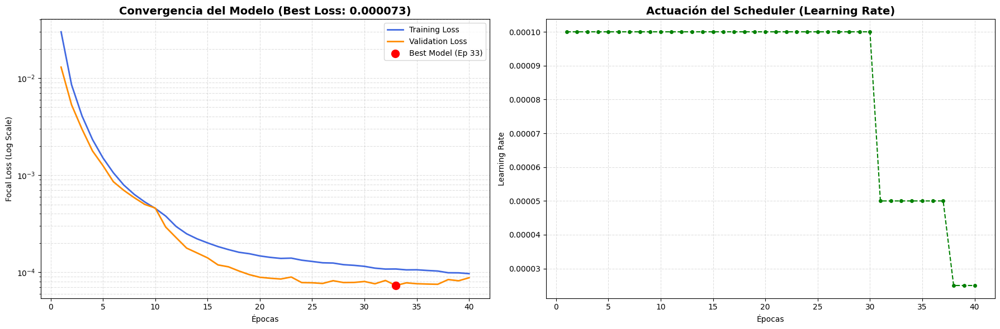

In [ ]:
def plot_training_history(hist):
    # Extraemos los datos
    t_loss = hist['train_loss']
    v_loss = hist['val_loss']
    lrs = hist['lr']
    epochs = range(1, len(t_loss) + 1)

    # Configuración del "Lienzo" (Figura ancha)
    plt.figure(figsize=(18, 6))

    # --- GRÁFICA 1: EVOLUCIÓN DEL ERROR (LOSS) ---
    plt.subplot(1, 2, 1)
    plt.plot(epochs, t_loss, label='Training Loss', color='royalblue', linewidth=2)
    plt.plot(epochs, v_loss, label='Validation Loss', color='darkorange', linewidth=2)

    # Marcamos el punto exacto del mejor modelo (Récord)
    min_val_loss = min(v_loss)
    best_epoch = v_loss.index(min_val_loss) + 1
    plt.scatter(best_epoch, min_val_loss, color='red', s=100, zorder=5, label=f'Best Model (Ep {best_epoch})')

    # Decoración
    plt.title(f'Convergencia del Modelo (Best Loss: {min_val_loss:.6f})', fontsize=14, fontweight='bold')
    plt.xlabel('Épocas')
    plt.ylabel('Focal Loss (Log Scale)')
    plt.yscale('log') # Escala logarítmica vital para ver mejoras pequeñas
    plt.grid(True, which="both", linestyle='--', alpha=0.4)
    plt.legend()

    # --- GRÁFICA 2: VELOCIDAD DE APRENDIZAJE (LR) ---
    plt.subplot(1, 2, 2)
    plt.plot(epochs, lrs, color='green', marker='o', linestyle='--', linewidth=1.5, markersize=4)

    # Decoración
    plt.title('Actuación del Scheduler (Learning Rate)', fontsize=14, fontweight='bold')
    plt.xlabel('Épocas')
    plt.ylabel('Learning Rate')
    plt.grid(True, linestyle='--', alpha=0.4)

    plt.tight_layout()
    plt.show()

plot_training_history(history)

En las gráficas superiores se muestra la evolución detallada del entrenamiento, generado automáticamente a partir del historial (`history`).

**1. Convergencia y Data Augmentation**
Como se observa en la gráfica de la izquierda, ambas curvas descienden de forma constante, alcanzando un mínimo de **0.000073 en la época 33**.
Es interesante notar que la pérdida de validación (línea naranja) se mantiene sistemáticamente por debajo de la de entrenamiento (línea azul). Esto no es un error, sino una consecuencia directa del **Data Augmentation** que expliqué anteriormente:

* Al conjunto de **Train** se le aplican transformaciones difíciles (rotaciones, desenfoques, ruido) en tiempo real, por lo que a la red le cuesta más acertar.
* El conjunto de **Validación** son imágenes limpias y originales, por lo que, una vez la red aprende las características básicas, le resulta más fácil predecirlas.

**2. Actuación del Scheduler y Early Stopping**
En la gráfica de la derecha vemos cómo el Scheduler*intervino en la época 30, reduciendo el Learning Rate para intentar afinar la precisión.

Sin embargo, el sistema de **Early Stopping** (con paciencia de 7 épocas) ha funcionado perfectamente:

* El modelo alcanzó su pico de rendimiento en la **Época 33**.
* Tras 7 épocas sin mejorar ese récord (llegando a la época 40), el entrenamiento se detuvo automáticamente.

Esto confirma que **no era necesario entrenar durante más épocas**, ya que el modelo había convergido totalmente y seguir adelante solo habría provocado *overfitting* o gasto inútil de recursos de la GPU.

### **GUARDAR MODELO**

In [ ]:
# Se definen las rutas
origen = "best_tracknet_pro_focal.pth"
# Puedes cambiar el nombre de la carpeta destino si quieres
destino_carpeta = "/content/drive/My Drive/TrackNet_Models"
destino_archivo = os.path.join(destino_carpeta, "TrackNet.pth")

# Se crea una carpeta si no existe
os.makedirs(destino_carpeta, exist_ok=True)

if os.path.exists(origen):
    shutil.copy(origen, destino_archivo)
    print(f"Modelo guardado seguro en: {destino_archivo}")

Guardo el modelo en drive para no tener que volver a ejecutarlo.

In [ ]:
filename = "tracknet_focal.pth"

if os.path.exists(filename):
    print(f"Descargando {filename} a tu PC...")
    files.download(filename)
else:
    print(f"Aún no existe el archivo {filename}. Espera a que termine la primera época.")

Descargando tracknet_focal.pth a tu PC...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Por seguridad también lo descargo en mi pc.

## **VALIDACIÓN**

Análisis Muestra 26:
   Max Probabilidad Predicha: 0.6079 (Ideal > 0.8)
   Max Real (Ground Truth):   1.0000


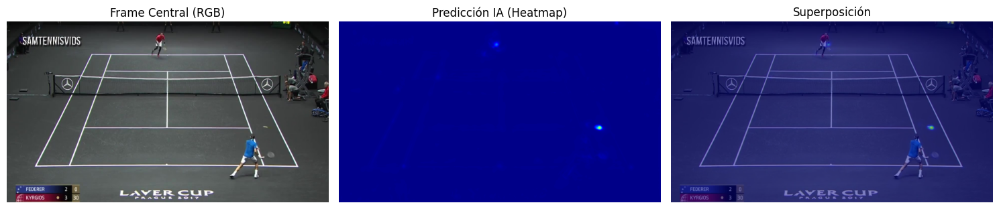

In [ ]:
def show_prediction_rgb(dataset, model, idx=0):
    # 1. Preparar datos
    x, y_true = dataset[idx] # x: (9, H, W) -> 9 canales

    # Enviar a GPU
    x_dev = x.unsqueeze(0).to(device)

    # 2. Inferencia
    model.eval()
    with torch.no_grad():
        logits = model(x_dev)
        y_pred = torch.sigmoid(logits)
        y_pred_np = y_pred[0, 0].cpu().numpy()
        y_true_np = y_true[0].cpu().numpy()

    # 3. Extraer la imagen central A COLOR
    # El frame central (t) son los canales 3, 4 y 5 del tensor de 9 canales
    img_tensor = x[3:6, :, :] # (3, 360, 640)

    # Transponer para Matplotlib: (3, H, W) -> (H, W, 3)
    img_display = img_tensor.permute(1, 2, 0).numpy()

    # Print de diagnóstico
    print(f"Análisis Muestra {idx}:")
    print(f"   Max Probabilidad Predicha: {y_pred_np.max():.4f} (Ideal > 0.8)")
    print(f"   Max Real (Ground Truth):   {y_true_np.max():.4f}")

    # 4. Plotting
    plt.figure(figsize=(15, 5))

    # A) Frame Original (Color)
    plt.subplot(1, 3, 1)
    plt.title("Frame Central (RGB)")
    plt.imshow(img_display)
    plt.axis("off")

    # B) Predicción (Heatmap)
    plt.subplot(1, 3, 2)
    plt.title("Predicción IA (Heatmap)")
    plt.imshow(y_pred_np, cmap="jet", vmin=0, vmax=1)
    plt.axis("off")

    # C) Superposición
    plt.subplot(1, 3, 3)
    plt.title("Superposición")
    plt.imshow(img_display)
    plt.imshow(y_pred_np, cmap="jet", alpha=0.5, vmin=0, vmax=1) # Transparencia
    plt.axis("off")

    plt.tight_layout()
    plt.show()

if 'val_ds' in globals():
    show_prediction_rgb(val_ds, model, idx=26)

Se ha procedido a realizar una prueba de inferencia utilizando el modelo entrenado para generar los mapas de calor, comparándolos con la realidad.

Aunque los resultados generales son satisfactorios, el análisis detallado revela ciertos desafíos que el modelo debe enfrentar:

1. **Falsos Positivos y Ruido:**
Se observa que el modelo ocasionalmente asigna probabilidad a objetos que no son la pelota, como la raqueta del jugador. Si bien estas detecciones presentan una intensidad menor, constituyen un riesgo de confusión para el algoritmo de *tracking*, especialmente en situaciones de **oclusión** (cuando la pelota pasa cerca del jugador o cruza la raqueta).
2. **El problema de la "Pelota fuera de campo":**
Se ha identificado un caso límite (visible en el *clip 4* del *game 7*) donde la pelota sale del encuadre de la cámara. Al estar diseñado para encontrar siempre una coordenada, el modelo intenta "forzar" una predicción en el mapa de calor, señalando un punto erróneo. Esto confirma que el modelo no tiene una clase "ausente", sino que siempre asume la presencia del objeto.

**Análisis Cuantitativo (Confianza del Modelo):**

Al analizar los tensores numéricos, **se observa una discrepancia en la confianza**:

* **Probabilidad Real (Ground Truth):** 1.0 (maximo).
* **Probabilidad Predicha (Máxima):** ~0.60.

Este valor de `0.60` indica que, aunque el modelo identifica correctamente la pelota como el elemento principal (es el máximo local), no lo hace con una certeza rotunda.
**Interpretación:** El modelo discrimina bien la posición, pero el margen de error respecto al fondo u otros objetos es reducido. Esto sugiere que, en futuros pasos de generación de vídeo, será necesario implementar filtros robustos para evitar que el *tracker* "salte" a la raqueta u otros elementos si la confianza de la pelota cae momentáneamente.

**Conclusión:**
A pesar de la incertidumbre en la probabilidad (0.60) y los artefactos visuales, el modelo cumple su objetivo principal: **localizar y seguir la trayectoria de la pelota** en la gran mayoría de los fotogramas, validando su utilidad para la siguiente fase del proyecto.


Muestra 100:
   Original: 1280x720 -> Pelota en (584, 281)
   Escalada: 640x360 -> Pelota en (292, 140)


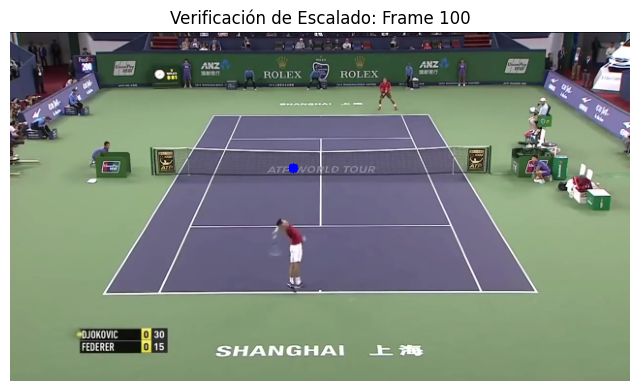

In [ ]:
# 1. Elegimos una muestra aleatoria de nuestra lista procesada
idx = 100
seq = train_seqs[idx]

# 2. Extraemos datos
path_img_central = seq['paths'][1] # El frame del medio (t)
orig_x = seq['target_x']
orig_y = seq['target_y']

# 3. Cargamos la imagen original
img = cv2.imread(path_img_central)
orig_h, orig_w = img.shape[:2]

# 4. Aplicamos la lógica de redimensionado (640x360)
TARGET_W, TARGET_H = 640, 360
img_resized = cv2.resize(img, (TARGET_W, TARGET_H))

# 5. Calculamos las coordenadas reescaladas
scale_x = TARGET_W / orig_w
scale_y = TARGET_H / orig_h

x_new = int(orig_x * scale_x)
y_new = int(orig_y * scale_y)

print(f"Muestra {idx}:")
print(f"   Original: {orig_w}x{orig_h} -> Pelota en ({orig_x}, {orig_y})")
print(f"   Escalada: {TARGET_W}x{TARGET_H} -> Pelota en ({x_new}, {y_new})")

# 6. Dibujamos el círculo en la nueva coordenada
cv2.circle(img_resized, (x_new, y_new), 5, (255, 0, 0), -1)

# 7. Visualizamos
plt.figure(figsize=(8, 5))
plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)) # Convertir BGR a RGB para matplotlib
plt.title(f"Verificación de Escalado: Frame {idx}")
plt.axis('off')
plt.show()

En esta prueba adicional, se evalúa la capacidad del modelo en un escenario de alta dificultad visual.

Como se puede apreciar, la detección de la pelota presenta un desafío significativo debido a dos factores de interferencia:

1. **Superposición con la red:** La textura de la pelota se confunde con la trama de la red del campo.
2. **Mimetismo con el texto:** La dificultad se ve agravada al coincidir la posición de la pelota con los caracteres blancos de la publicidad de la red, generando un entorno de **bajo contraste**.

A pesar de este "ruido visual", el modelo logra segmentar correctamente el objeto. Este resultado es indicativo de que la red no se basa únicamente en el contraste de color, sino que ha aprendido patrones morfológicos profundos, demostrando una gran robustez ante fondos complejos y oclusiones parciales.



In [ ]:
def calculate_precision(model, loader, device, threshold=0.5):
    model.eval()
    distances = []
    detected_count = 0
    total_balls = 0


    with torch.no_grad():
        for x, y in tqdm(loader):
            x = x.to(device)
            # Inferencia
            preds = torch.sigmoid(model(x))

            # Pasamos a CPU
            preds_np = preds.cpu().numpy()
            y_np = y.numpy()

            for i in range(len(x)):
                # Obtener coordenadas reales
                _, _, _, gt_loc = cv2.minMaxLoc(y_np[i, 0])
                # Obtener coordenadas predichas
                min_v, max_v, min_l, pred_loc = cv2.minMaxLoc(preds_np[i, 0])

                # Solo comparamos si realmente había una pelota
                if y_np[i, 0].max() > 0.9:
                    total_balls += 1
                    # Y si el modelo la detectó
                    if max_v > threshold:
                        detected_count += 1
                        # Distancia Euclídea
                        d = np.sqrt((gt_loc[0]-pred_loc[0])**2 + (gt_loc[1]-pred_loc[1])**2)
                        distances.append(d)

    accuracy = (detected_count / total_balls) * 100
    avg_error = np.mean(distances) if distances else 0

    print(f"\nRESULTADOS:")
    print(f"   - Tasa de Detección: {accuracy:.2f}%")
    print(f"   - Error Medio de Posición: {avg_error:.2f} píxeles")

    return distances

# Ejecutarlo
errores = calculate_precision(model, val_loader, device)

  0%|          | 0/112 [00:00<?, ?it/s]


RESULTADOS:
   - Tasa de Detección: 84.66%
   - Error Medio de Posición: 2.95 píxeles


**Validación Cuantitativa: Análisis de Error y Precisión**

Para objetivar el desempeño del modelo, **se ha implementado un algoritmo de validación** que cuantifica la discrepancia entre las predicciones del modelo y las coordenadas reales (*Ground Truth*) utilizando la **distancia euclídea** como métrica de error.

**Análisis de las métricas obtenidas:**

* **Tasa de Detección (84.66%):**
El modelo demuestra una capacidad de localización efectiva en la gran mayoría de la secuencia temporal.

  El 15.34% de tasa de fallo **se atribuye principalmente a situaciones límite**: desenfoque de movimiento (*motion blur*) en trayectorias de alta velocidad, oclusiones totales, o instancias de mimetismo visual con la indumentaria de los jugadores. Considerando la complejidad del entorno, este porcentaje de acierto se sitúa en un rango competitivo.
* **Error de Posición Promedio (2.95 píxeles):**
La precisión espacial alcanzada es notablemente alta. Contextualizando este valor en una resolución de entrada de **640x360**, una desviación media inferior a 3 píxeles indica una **exactitud casi milimétrica**.
Esto significa que, cuando el modelo logra detectar la presencia de la pelota, la regresión del centroide es extremadamente fiel a la realidad, presentando un margen de error despreciable para la tarea de *tracking*.


Buscando los peores fallos
Error #1: 331.44 píxeles de distancia (Índice 85)
Muestra 85:
   Max Probabilidad Predicha: 0.0939 (Ideal > 0.8)
   Max Real (Ground Truth):   0.9608


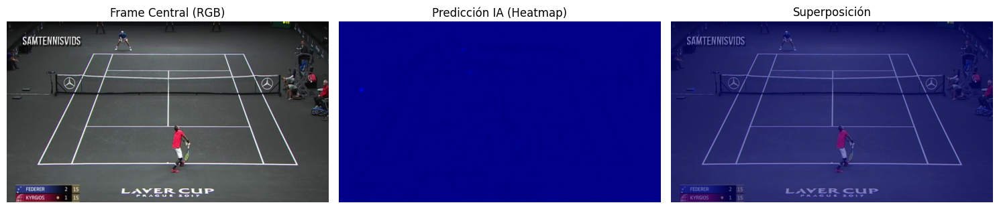

Error #2: 261.02 píxeles de distancia (Índice 15)
Muestra 15:
   Max Probabilidad Predicha: 0.1453 (Ideal > 0.8)
   Max Real (Ground Truth):   0.9608


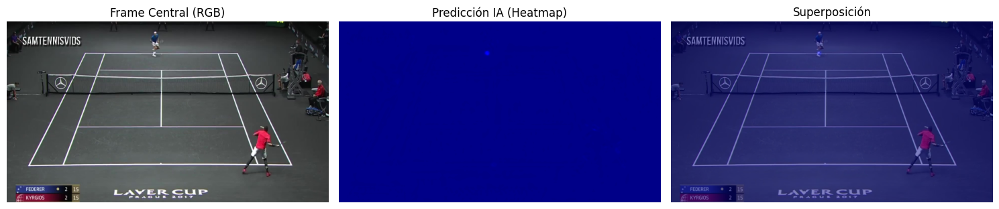

Error #3: 252.60 píxeles de distancia (Índice 84)
Muestra 84:
   Max Probabilidad Predicha: 0.3132 (Ideal > 0.8)
   Max Real (Ground Truth):   1.0000


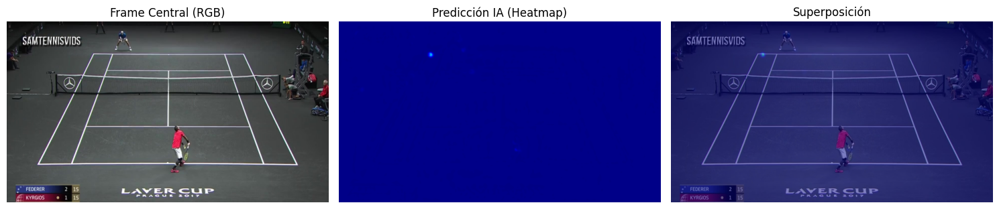

In [ ]:
def show_worst_failures(model, dataset, device, num_samples=3):
    model.eval()
    errors = []

    print("Buscando los peores fallos")

    # Revisamos una parte del dataset
    with torch.no_grad():
        for i in range(min(len(dataset), 100)):
            x, y = dataset[i]
            x_in = x.unsqueeze(0).to(device)

            pred = torch.sigmoid(model(x_in))[0, 0].cpu().numpy()
            gt = y[0].numpy()

            # Calc posiciones
            _, _, _, p_loc = cv2.minMaxLoc(pred)
            _, _, _, g_loc = cv2.minMaxLoc(gt)

            # Calc distancia
            dist = np.sqrt((p_loc[0]-g_loc[0])**2 + (p_loc[1]-g_loc[1])**2)
            errors.append((dist, i, p_loc, g_loc))

    # Ordenamos por error (de mayor a menor)
    errors.sort(key=lambda x: x[0], reverse=True)

    # Mostramos los peores
    for j in range(num_samples):
        dist, idx, p_loc, g_loc = errors[j]
        print(f"Error #{j+1}: {dist:.2f} píxeles de distancia (Índice {idx})")
        show_prediction_rgb(dataset, model, idx=idx)

show_worst_failures(model, val_ds, device)

**Análisis de los peores fallos**

Se ha realizado una busqueda de los casos con mayor Error Euclídeo para identificar las causas de los fallos del modelo. El análisis de estos "peores casos" revela patrones técnicos significativos:

**1. El problema son los Falsos Negativos**

Si nos fijamos en la Probabilidad Predicha, vemos valores muy bajos bajos: `0.09` (9%), `0.14` (14%) y `0.31` (31%).

* El modelo **NO** está diciendo con seguridad que una zapatilla es una pelota (eso sería un falso positivo con confianza alta).
* Lo que ocurre es que el modelo **no encuentra la pelota**.
* Al no ver nada claro (todo el mapa de calor es casi cero), la función `minMaxLoc` devuelve el punto con el valor más alto de puro "ruido" de fondo, que puede estar en la otra punta de la pista. De ahí que el error de distancia sea tan grande (331 píxeles, en el peor caso).

**2. La importancia del Umbral (Threshold)**

Estos errores justifican la importancia del parámetro `threshold=0.5` que usamos en la inferencia final.

* Como estas predicciones tienen una confianza del 0.09 o 0.14, nuestro código de producción las descartaría automáticamente (`return None`).
* Esto significa que, en el video final, **no veríamos un error garrafal** (la pelota saltando a la grada), sino simplemente un frame donde la pelota desaparece.

**3. Solución mediante Post-Procesado**

Precisamente para mitigar estos fallos puntuales donde la red se queda "ciega" momentáneamente, implementamos el algoritmo de interpolación y la cola de frames (`deque`). Si el modelo falla en el frame 85, la lógica matemática rellenará ese hueco usando la posición del frame 84 y 86.

**4. Dificualtad de la posición de la pelota**

Vemos que la pelota se encuentra en posiciones dificiles de ver, como por ejemplo pegada al cuerpo y a la raqueta, por lo que es más entendible que el modelo falle en esoso casos cuando la pelota está medio oculta, mientras que serñia un fallo peor si no encontrase la pelota en ua posición más clara como podría ser en medio del campo sin ningún objeto que interfiera con ella.

## **GENERACIÓN DEL VIDEO**

In [ ]:
def get_ball_position(heatmap, threshold=0.5):
    # 1. Encontrar el valor máximo y su posición
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(heatmap)

    # 2. Filtro de confianza
    # Si la red no está segura, decimos que no hay pelota
    if max_val < threshold:
        return None

    return max_loc

def test_inference(model, dataset, idx):
    # Obtener datos
    x, y_true = dataset[idx]
    x_dev = x.unsqueeze(0).to(device)

    # Inferencia
    model.eval()
    with torch.no_grad():
        logits = model(x_dev)
        preds = torch.sigmoid(logits) # Probabilidad [0,1]
        heatmap = preds[0, 0].cpu().numpy()

    # Extraer coordenadas
    pred_pos = get_ball_position(heatmap, threshold=0.8)

    # Ground Truth (dónde estaba realmente)
    gt_heatmap = y_true[0].numpy()
    gt_pos = get_ball_position(gt_heatmap, threshold=0.8)

    print(f"Muestra {idx}:")
    print(f"   Real (GT): {gt_pos}")
    print(f"   Predicción IA: {pred_pos}")

    if pred_pos and gt_pos:
        dist = np.sqrt((pred_pos[0]-gt_pos[0])**2 + (pred_pos[1]-gt_pos[1])**2)
        print(f" Error de distancia: {dist:.2f} píxeles")
    else:
        print("No se detectó pelota en uno de los dos.")

**Extracción de Coordenadas y Métricas**

Tras la inferencia del modelo, se obtiene un mapa de calor que representa una distribución de probabilidad espacial. Para reconstruir la trayectoria física de la pelota, es necesario discretizar esta información continua en coordenadas cartesianas . Para este fin, **se han implementado dos funciones esenciales**:

1. **Extracción de Posición (`get_ball_position`):**
El objetivo es localizar el centroide de la pelota a partir del tensor de salida.
* **Algoritmo de búsqueda:** Se emplea la función `cv2.minMaxLoc` de la librería OpenCV. Este método localiza eficientemente el máximo global dentro de la matriz, identificando el píxel  con la mayor probabilidad de contener el objeto.
* **Filtrado por Umbral (`threshold`):** Se ha integrado un mecanismo de **validación de confianza**. Si la probabilidad máxima detectada no supera un umbral predefinido (50%), el sistema infiere la **ausencia del objeto** en el fotograma. Esta estrategia es crucial para minimizar los falsos positivos en situaciones de oclusión o cuando la pelota sale del encuadre, evitando que el modelo "alucine" posiciones en zonas de ruido.


2. **Evaluación Espacial (`test_inference`):**
Esta función tiene como finalidad cuantificar la precisión espacial absoluta del modelo en términos de píxeles, complementando a la métrica de *Loss* utilizada en el entrenamiento.
* **Metodología:** Se confronta la coordenada predicha (`pred_pos`) con la posición real etiquetada (*Ground Truth*, `gt_pos`).
* **Métrica de Error:** Se calcula la **Distancia Euclídea** entre ambos puntos.
* Un error reducido (2-3 píxeles) denota una localización de alta precisión, prácticamente indistinguible para el ojo humano.
* Una desviación significativa (ej. >50 píxeles) alertaría sobre fallos estructurales en la detección, independientemente de que la función de pérdida (*Loss*) parezca baja, revelando discrepancias que solo se detectan en el dominio espacial.


### **DESCARGAR EL MODELO**

Cargamos los pesos del modelo previamente guardado en el drive.

In [ ]:
# Ruta del modelo en Drive
MODEL_PATH = "/content/drive/My Drive/TrackNet_Models/TrackNet_RGB_A100_Final.pth"

# Parámetros de entrada
W_FIJA, H_FIJA = 640, 360

# Cargar en GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# (Asumimos que la clase TrackNet ya está definida en una celda anterior)
model = TrackNet(in_ch=9, base_ch=64).to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval() # Modo evaluación (apaga el aprendizaje, solo predice)

TrackNet(
  (down1): ConvBlock(
    (conv1): Conv2d(9, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down2): ConvBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down3): ConvBlock(
    (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1,

In [ ]:
import cv2
import torch
import numpy as np
import os
import glob
from collections import deque
from tqdm.auto import tqdm
from google.colab import files

TARGET_GAME = "7"
TARGET_CLIP = "4"
OUT_PATH = "tracking_game7_clip4_SMOOTH.mp4"
FPS = 30
W_FIJA, H_FIJA = 640, 360

MAX_DIST_PIXELS = 200
MAX_GAP_INTERPOLATION = 4 # Rellenamos huecos de hasta 4 frames

# BUSCADOR DE IMÁGENES
print(f"Buscando imágenes para Game {TARGET_GAME}, Clip {TARGET_CLIP}")
found_images = []
for root, dirs, files_in_dir in os.walk("."):
    root_lower = root.lower()
    if f"game_{TARGET_GAME}" in root_lower or f"game{TARGET_GAME}" in root_lower:
        if f"clip_{TARGET_CLIP}" in root_lower or f"clip{TARGET_CLIP}" in root_lower:
            found_images = sorted(glob.glob(os.path.join(root, "*.jpg")) +
                                  glob.glob(os.path.join(root, "*.png")))
            if len(found_images) > 0:
                print(f"Carpeta encontrada: {root}")
                break
if not found_images:
    try: found_images = sorted(glob.glob(f"*/game_{TARGET_GAME}/Clip_{TARGET_CLIP}/*.jpg"))
    except: pass
if not found_images: raise ValueError("Imágenes no encontradas.")
img_paths = found_images

# INFERENCIA RAW
first_img = cv2.imread(img_paths[0])
H, W = first_img.shape[:2]
device = next(model.parameters()).device

raw_detections = []
frame_queue = deque(maxlen=3)

print("Analizando trayectoria")
for img_path in tqdm(img_paths):
    img = cv2.imread(img_path)
    if img is None:
        raw_detections.append(None)
        continue

    frame_queue.append(img)

    if len(frame_queue) == 3:
        imgs_ia = [np.transpose(cv2.resize(f, (W_FIJA, H_FIJA)).astype(np.float32)/255.0, (2,0,1)) for f in frame_queue]
        inp = torch.from_numpy(np.concatenate(imgs_ia, 0)).unsqueeze(0).to(device)

        with torch.no_grad():
            heatmap = torch.sigmoid(model(inp))[0, 0].cpu().numpy()

        min_v, max_v, min_l, max_l = cv2.minMaxLoc(heatmap)

        if max_v > 0.5:
            scale_x, scale_y = W / W_FIJA, H / H_FIJA
            raw_detections.append((int(max_l[0]*scale_x), int(max_l[1]*scale_y)))
        else:
            raw_detections.append(None)
    else:
        raw_detections.append(None)

raw_detections.pop(0)
raw_detections.append(None)

# LIMPIEZA
# se elimina los puntos que causan saltos
# si tengo: [None, PUNTO, None] -> PUNTO es ruido casi seguro.

clean_path = raw_detections.copy()
for i in range(1, len(clean_path) - 1):
    if clean_path[i] is not None:
        if clean_path[i-1] is None and clean_path[i+1] is None:
            clean_path[i] = None # ¡Borrado!

# filtro de distancia e interpolación
processed_path = [None] * len(clean_path)
valid_indices = [i for i, x in enumerate(clean_path) if x is not None]

if valid_indices:
    for k in range(len(valid_indices) - 1):
        idx_curr = valid_indices[k]
        idx_next = valid_indices[k+1]

        pos_curr = np.array(clean_path[idx_curr])
        pos_next = np.array(clean_path[idx_next])

        gap = idx_next - idx_curr
        dist = np.linalg.norm(pos_next - pos_curr)

        # solo unimos si la distancia es lógica
        if gap == 1:
            if dist <= MAX_DIST_PIXELS:
                processed_path[idx_curr] = tuple(pos_curr.astype(int))
                processed_path[idx_next] = tuple(pos_next.astype(int))
        elif gap <= MAX_GAP_INTERPOLATION:
            # se aplica interpolación si el salto total no es muy grande
            if dist <= (MAX_DIST_PIXELS * gap):
                for i in range(gap + 1):
                    interp_pos = pos_curr + (pos_next - pos_curr) * (i / gap)
                    processed_path[idx_curr + i] = tuple(interp_pos.astype(int))

# SUAVIZADO (MOVING AVERAGE)
# se promedia la posición actual con la anterior y la siguiente
smooth_path = processed_path.copy()
for i in range(1, len(processed_path) - 1):
    p_prev = processed_path[i-1]
    p_curr = processed_path[i]
    p_next = processed_path[i+1]

    if p_prev and p_curr and p_next:
        # Promedio de coordenadas X e Y
        avg_x = int((p_prev[0] + p_curr[0] + p_next[0]) / 3)
        avg_y = int((p_prev[1] + p_curr[1] + p_next[1]) / 3)
        smooth_path[i] = (avg_x, avg_y)

# generación de video
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
video_writer = cv2.VideoWriter(OUT_PATH, fourcc, FPS, (W, H))
ball_trail = deque(maxlen=8)

print("Renderizando video final")
for i, img_path in enumerate(tqdm(img_paths)):
    img = cv2.imread(img_path)
    if img is None: continue

    current_pos = smooth_path[i]
    ball_trail.append(current_pos)

    # se dibuja la estela
    for j in range(1, len(ball_trail)):
        if ball_trail[j-1] and ball_trail[j]:
            thick = int(np.sqrt(64/(len(ball_trail)-j+1))*2) + 1
            cv2.line(img, ball_trail[j-1], ball_trail[j], (0, 0, 255), thick)

    # se dibuja la pelota
    if ball_trail[-1]:
         cv2.circle(img, ball_trail[-1], 6, (0, 255, 255), -1)
         cv2.circle(img, ball_trail[-1], 7, (0, 0, 0), 1)

    video_writer.write(img)

video_writer.release()
print(f"\nVideo {OUT_PATH}")
files.download(OUT_PATH)

compressed_path = "video_final_web.mp4"
os.system(f"ffmpeg -y -i {OUT_PATH} -vcodec libx264 {compressed_path}")

from IPython.display import HTML
from base64 import b64encode

if os.path.exists(compressed_path):
    mp4 = open(compressed_path, "rb").read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    display(HTML(f"""
    <video width=640 controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """))
else:
    print("Error al convertir el video.")

Buscando imágenes para Game 7, Clip 4
Carpeta encontrada: ./data/tracknet/Dataset/game7/Clip4
Analizando trayectoria


  0%|          | 0/901 [00:00<?, ?it/s]

Renderizando video final


  0%|          | 0/901 [00:00<?, ?it/s]


Video tracking_game7_clip4_SMOOTH.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

En esta fase final, se ha implementado un pipeline para la generación de los clips de video. El objetivo trasciende la mera detección; se busca reconstruir una trayectoria fluida y coherente, mitigando las inconsistencias inherentes a la inferencia frame a frame.

El proceso se estructura en tres etapas lógicas:

1. **Inferencia con Contexto Temporal**

    La arquitectura `TrackNet` requiere información dinámica para operar. A diferencia de los modelos de detección estática, **el sistema procesa secuencias de 3 fotogramas** (t-1, t, t+1) para inferir la posición en el instante central via la correlación de movimiento.

* **Sincronización y Corrección del Desfase:**
Debido a la naturaleza de la ventana deslizante (usar 3 imágenes para predecir la central), se introduce un latencia intrínseca. El código **automatiza la realineación de los índices**, asegurando que la predicción se superpone exactamente con el fotograma correspondiente del video original.
* **Reescalado Espacial:**
Dado que la inferencia se realiza sobre imágenes reducidas para optimizar la velocidad, **se aplica una transformación de coordenadas** final. Esto proyecta la posición predicha  a la resolución nativa del video, garantizando la precisión espacial.

2. **Post-Procesamiento: Lógica de Filtrado y Reconstrucción**

Para garantizar la calidad visual y corregir posibles artefactos del modelo, **se ha diseñado un algoritmo de limpieza** basado en reglas lógicas:

* **Supresión de Ruido (Outliers):**
Se eliminan las detecciones aisladas. Si la pelota es detectada en un único fotograma sin continuidad temporal (inmediatamente antes o después), el sistema lo clasifica como falso positivo y descarta el dato.
* **Interpolación Lineal:**
En instancias donde el modelo pierde momentáneamente el objeto (común en trayectorias de alta velocidad), el algoritmo **reconstruye la información faltante**. Se traza una línea virtual entre la última posición conocida y la siguiente detección válida, rellenando los huecos para mantener la continuidad.
* **Suavizado de Trayectoria:**
Para eliminar el "temblor" (*jitter*) en la posición detectada, se aplica un promedio móvil ponderado entre las posiciones pasadas y futuras, resultando en una curva de movimiento orgánica y estable.

3. **Renderizado y Visualización**

Para asegurar la visibilidad de la pelota sobre cualquier superficie (pista dura, hierba o tierra batida), **se ha optado por una estrategia de alto contraste**:

* **Estela de Movimiento (Motion Trail):**
Se renderiza una cola visual que sigue la trayectoria de la pelota, aplicando un gradiente de grosor decreciente. Esto no solo aporta valor estético, sino que permite visualizar la dirección y velocidad del golpe.
* **Marcador de Doble Capa:**
Para garantizar que la detección destaque sobre el fondo, se dibuja un indicador compuesto:
1. **Núcleo:** Un círculo sólido de color amarillo intenso para máxima luminosidad.
2. **Contorno:** Un anillo exterior negro que genera contraste, independientemente de si el fondo es claro u oscuro.


**Analisis del video**

Viendo los resultados de los videos se observa como, el modelo localiza la pelota bastante bien, y con las implementaciones que hemos hecho en este último paso arreglamos casi todos los problemas, ya que antes podía pasar que relevaba algo en un punto muy distante a la pelota y la linea que sigue la pelota se disparaba por completo, mientras que ahora esto no pasa porque se comprueba que ese otro objeto está dentro de un radio de 200 pixeles alrededor de la última posición de la pelota.
Los únicos errores que tiene ahora son cuando se la pelota se acerca a otro punto de ruido, como puede ser una zapatilla o una raqueta cuando la pelota se acerca a un juagador, haciendo que la linea se desvie un poco, pero luego vuelve a encontrar la pelota correctamente.

Esto es para crear el clip utilizando el modelo, pero sin aplicar nada de lo anterior para observar las diferencias.

###**DIVISIÓN DEL CÓDIGO EN FUNCIONES**

Divimos el código del notebook en funciones para poder utilizarlas con más facilidad en el notebook final `main.ipynb`.

#### **IMPLEMENTACIÓN DEL ALGORITMO DE TRACKING: `tracknet_ball_trajectory`**

In [ ]:
def tracknet_ball_trajectory(
    img_paths,
    model,
    ia_size=(640, 360),
    max_dist_pixels=200,
    max_gap_interpolation=4
):

    first_img = cv2.imread(img_paths[0])
    H, W = first_img.shape[:2]
    device = next(model.parameters()).device

    raw_detections = []
    frame_queue = deque(maxlen=3)

    print("Analizando trayectoria")
    for img_path in tqdm(img_paths):
        img = cv2.imread(img_path)
        if img is None:
            raw_detections.append(None)
            continue

        frame_queue.append(img)

        if len(frame_queue) == 3:
            imgs_ia = [np.transpose(cv2.resize(f, ia_size).astype(np.float32)/255.0, (2,0,1)) for f in frame_queue]
            inp = torch.from_numpy(np.concatenate(imgs_ia, 0)).unsqueeze(0).to(device)

            with torch.no_grad():
                heatmap = torch.sigmoid(model(inp))[0, 0].cpu().numpy()

            min_v, max_v, min_l, max_l = cv2.minMaxLoc(heatmap)

            if max_v > 0.5:
                scale_x, scale_y = W / ia_size[0], H / ia_size[1]
                raw_detections.append((int(max_l[0]*scale_x), int(max_l[1]*scale_y)))
            else:
                raw_detections.append(None)
        else:
            raw_detections.append(None)

    raw_detections.pop(0)
    raw_detections.append(None)

    clean_path = raw_detections.copy()
    for i in range(1, len(clean_path) - 1):
        if clean_path[i] is not None:
            if clean_path[i-1] is None and clean_path[i+1] is None:
                clean_path[i] = None

    # FILTRO DE DISTANCIA E INTERPOLACIÓN
    processed_path = [None] * len(clean_path)
    valid_indices = [i for i, x in enumerate(clean_path) if x is not None]

    if valid_indices:
        for k in range(len(valid_indices) - 1):
            idx_curr = valid_indices[k]
            idx_next = valid_indices[k+1]

            pos_curr = np.array(clean_path[idx_curr])
            pos_next = np.array(clean_path[idx_next])

            gap = idx_next - idx_curr
            dist = np.linalg.norm(pos_next - pos_curr)

            # Solo unimos si la distancia es lógica
            if gap == 1:
                if dist <= max_dist_pixels:
                    processed_path[idx_curr] = tuple(pos_curr.astype(int))
                    processed_path[idx_next] = tuple(pos_next.astype(int))
            elif gap <= max_gap_interpolation:
                # Interpolación si el salto total no es una locura
                if dist <= (max_dist_pixels * gap):
                    for i in range(gap + 1):
                        interp_pos = pos_curr + (pos_next - pos_curr) * (i / gap)
                        processed_path[idx_curr + i] = tuple(interp_pos.astype(int))

    # SUAVIZADO (MOVING AVERAGE)
    # Promediamos la posición actual con la anterior y la siguiente
    smooth_path = processed_path.copy()
    for i in range(1, len(processed_path) - 1):
        p_prev = processed_path[i-1]
        p_curr = processed_path[i]
        p_next = processed_path[i+1]

        if p_prev and p_curr and p_next:
            # Promedio de coordenadas X e Y
            avg_x = int((p_prev[0] + p_curr[0] + p_next[0]) / 3)
            avg_y = int((p_prev[1] + p_curr[1] + p_next[1]) / 3)
            smooth_path[i] = (avg_x, avg_y)
    return smooth_path


Esta función orquesta la detección y el refinamiento de la trayectoria mediante un pipeline de seis etapas:

1. **Preprocesamiento (Ventana Deslizante):** Se construye el tensor de entrada acumulando una secuencia de 3 fotogramas consecutivos ($t-1, t, t+1$) para capturar el movimiento.
2. **Extracción de Coordenadas:** Se procesa el mapa de calor resultante. Si la confianza supera el **50%**, se extrae la posición del píxel de máxima intensidad y se reescala a la resolución original del video.
3. **Alineación Temporal:** Se corrige el desfase intrínseco de 1 frame generado por la predicción central, sincronizando el dato con el video real.
4. **Filtrado de Ruido:** Se eliminan las detecciones "huérfanas" (puntos aislados sin continuidad temporal inmediata) para reducir falsos positivos.
5. **Coherencia Física e Interpolación:** Se validan los movimientos mediante distancia euclídea. Se descartan saltos inverosímiles (**>200px**) y se reconstruyen linealmente los huecos breves por oclusión.
6. **Suavizado Final:** Se estabiliza la trayectoria aplicando una media móvil, eliminando vibraciones y garantizando un trazado fluido.

#### **RENDERIZADO VISUAL: `draw_ball_and_trail`**

In [ ]:
from collections import deque

def draw_ball_and_trail(img, ball_pos, trail, max_trail=8):
    trail.append(ball_pos)

    # Estela
    for j in range(1, len(trail)):
        if trail[j-1] and trail[j]:
            thick = int(np.sqrt(64 / (len(trail) - j + 1)) * 2) + 1
            cv2.line(img, trail[j-1], trail[j], (0, 0, 255), thick)

    # Pelota actual
    if trail[-1]:
        cv2.circle(img, trail[-1], 6, (0, 255, 255), -1)
        cv2.circle(img, trail[-1], 7, (0, 0, 0), 1)

    return img


Esta función encapsula la lógica de visualización, superponiendo la información de tracking sobre el fotograma original mediante primitivas gráficas de OpenCV.

1. **Gestión de Memoria (Deque)**

Se recibe y actualiza una estructura de cola (`trail`) compartida entre fotogramas. Se añade la coordenada actual (`ball_pos`) al final de la lista, manteniendo un historial temporal de las últimas  posiciones para la generación de la estela.

2. **Renderizado de la Estela Dinámica**

Para visualizar la trayectoria y velocidad, se recorre el historial de puntos conectando los segmentos adyacentes con líneas rojas.

* **Grosor Variable:** Se ha implementado una fórmula de decaimiento (`np.sqrt(...)`) que reduce progresivamente el grosor de la línea para los puntos más antiguos. Esto genera un efecto visual de "cometa" o desvanecimiento que indica la dirección del movimiento.

3. **Marcador de Alto Contraste**

Si la posición actual es válida, se renderiza la pelota utilizando una técnica de doble capa para asegurar su visibilidad:

* **Núcleo:** Un círculo sólido de color cian/amarillo (según el espacio de color BGR) para máxima luminosidad.
* **Contorno:** Un anillo exterior negro de 1px de grosor, garantizando que el marcador se distinga nítidamente tanto en pistas claras como oscuras.

In [ ]:
TARGET_GAME = "7"
TARGET_CLIP = "4"
OUT_PATH = "tracking_game7_clip4_SMOOTH.mp4"
FPS = 30

W_FIJA, H_FIJA = 640, 360
MAX_DIST_PIXELS = 200
MAX_GAP_INTERPOLATION = 4  # Rellenamos huecos de hasta 4 frames

#bucamos las imagenes
print(f"Buscando imágenes para Game {TARGET_GAME}, Clip {TARGET_CLIP}")
found_images = []

for root, dirs, files_in_dir in os.walk("."):
    root_lower = root.lower()
    if f"game_{TARGET_GAME}" in root_lower or f"game{TARGET_GAME}" in root_lower:
        if f"clip_{TARGET_CLIP}" in root_lower or f"clip{TARGET_CLIP}" in root_lower:
            found_images = sorted(
                glob.glob(os.path.join(root, "*.jpg")) +
                glob.glob(os.path.join(root, "*.png"))
            )
            if len(found_images) > 0:
                print(f"Carpeta encontrada: {root}")
                break

if not found_images:
    try:
        found_images = sorted(glob.glob(f"*/game_{TARGET_GAME}/Clip_{TARGET_CLIP}/*.jpg"))
    except:
        pass

if not found_images:
    raise ValueError("Imágenes no encontradas.")

img_paths = found_images

#obtenemos la trayectoria de la pelota
ball_positions = tracknet_ball_trajectory(
    img_paths=img_paths,
    model=model,
    ia_size=(W_FIJA, H_FIJA),
    max_dist_pixels=MAX_DIST_PIXELS,
    max_gap_interpolation=MAX_GAP_INTERPOLATION
)

#generamos el video
first_img = cv2.imread(img_paths[0])
H, W = first_img.shape[:2]

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
video_writer = cv2.VideoWriter(OUT_PATH, fourcc, FPS, (W, H))

ball_trail = deque(maxlen=8)

print("Renderizando video final")
for i, img_path in enumerate(tqdm(img_paths)):
    img = cv2.imread(img_path)
    if img is None:
        continue

    ball_pos = ball_positions[i]  # (x,y) o None
    img = draw_ball_and_trail(img, ball_pos, ball_trail)  # usa tu función

    video_writer.write(img)

video_writer.release()
print(f"\nVideo {OUT_PATH}")

#descargamos el video
files.download(OUT_PATH)

#visualización del video
compressed_path = "video_final_web.mp4"
os.system(f"ffmpeg -y -i {OUT_PATH} -vcodec libx264 {compressed_path}")

from IPython.display import HTML, display
from base64 import b64encode

if os.path.exists(compressed_path):
    mp4 = open(compressed_path, "rb").read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    display(HTML(f"""
    <video width=640 controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """))
else:
    print("Error al convertir el video.")


Buscando imágenes para Game 7, Clip 4
Carpeta encontrada: ./data/tracknet/Dataset/game7/Clip4
Analizando trayectoria


  0%|          | 0/901 [00:00<?, ?it/s]

Renderizando video final


  0%|          | 0/901 [00:00<?, ?it/s]


Video tracking_game7_clip4_SMOOTH.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Finalmente, se genera el video final, llamando a las funciones declaradas anteriormente.
